In [1]:
### Definining name of analysis ###
name = '2023-06-02_LinusAccelerations_Flight2'
data_path = '../data/'
data_folder = 'linus-2023-06-02'
file_name = '00000017.BIN'
datasave_path = data_path+data_folder+'/'
result_path = '../Results/'+name
figure_path = '../Figures/'+name

In [2]:
from os import sys
import os
sys.path.append('../')

# Getting packages #
%matplotlib widget

from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
from scipy import optimize 
from scipy.io import savemat

import plotly.express as px

import main
from main import flight
from main import analysis
import propellers
import motors
from aircraft import airplane
import cl_finders

import data_exporter
import datetime

### Creating Folders for Results/Data ###
if not os.path.exists(result_path):
    os.makedirs(result_path)
if not os.path.exists(figure_path):
    os.makedirs(figure_path)

In [6]:
# Importing data, specifying import characteristics, backing up results
rate = "10ms"
interpolateM = "linear"
processor = "ArduPlane_4_3_3"

rawdata_name = data_folder+'/'+file_name.split('.')[0]+'_'+rate+'_'+interpolateM+'_'+processor+'.pkl'

# Checking if the data is already pickled for analysis
if os.path.exists(data_path+rawdata_name):
    df = pd.read_pickle(data_path+rawdata_name)
else:
    df = main.get_data(processor, data_folder+'/'+file_name, rate)
    df = df.interpolate(method=interpolateM)
    pd.to_pickle(df, data_path+rawdata_name) # Storing parsed data

Recording    - INFO     - Loading recording file using reader: ArdupilotDFReader and processor: AP433Dataflash
ArdupilotDFReader - INFO     - Begin processing ../data/linus-2023-06-02/00000017.BIN


yes


ArdupilotDFReader - INFO     - GPS time found on channel=GPS, instance=1
ArdupilotDFReader - INFO     - 2023-06-03 03:09:59 at board time = 1970-01-01 00:01:17.841005


linus-2023-06-02/00000017_10ms_linear_ArduPlane_4_3_3.pkl
../data/linus-2023-06-02/00000017_10ms_linear_ArduPlane_4_3_3.pkl


In [3]:
# Vehicle parameters
prop = propellers.aeronaut11x7_estimatedBEN() # Using aeronaut 20x8 for this flight
motor = motors.U7V2_280KV()  # Using U7 V2 motor

mass = 1.820 # Estimated with virtual bolt included
span = 2.54
chord = 0.2
linus = airplane(mass, chord, span)

P_systems = 0.3 # Amount of power consumed by everything except the ESC & motor

highorderpolar = True
print(linus.area)

0.508


# Need to Do for Power Estimate
1. Rotate the accelerations into the body frame (Find $\dot{U}$)
2. Estimate the propeller thrust $T$
3. Establish the variance of the measurement
4. Bin the results by airspeed!

$ P_{req} = T V_T - mg\dot{h} - m \dot{U} V_T $

# Generating Plots (Acceleration Visualization)

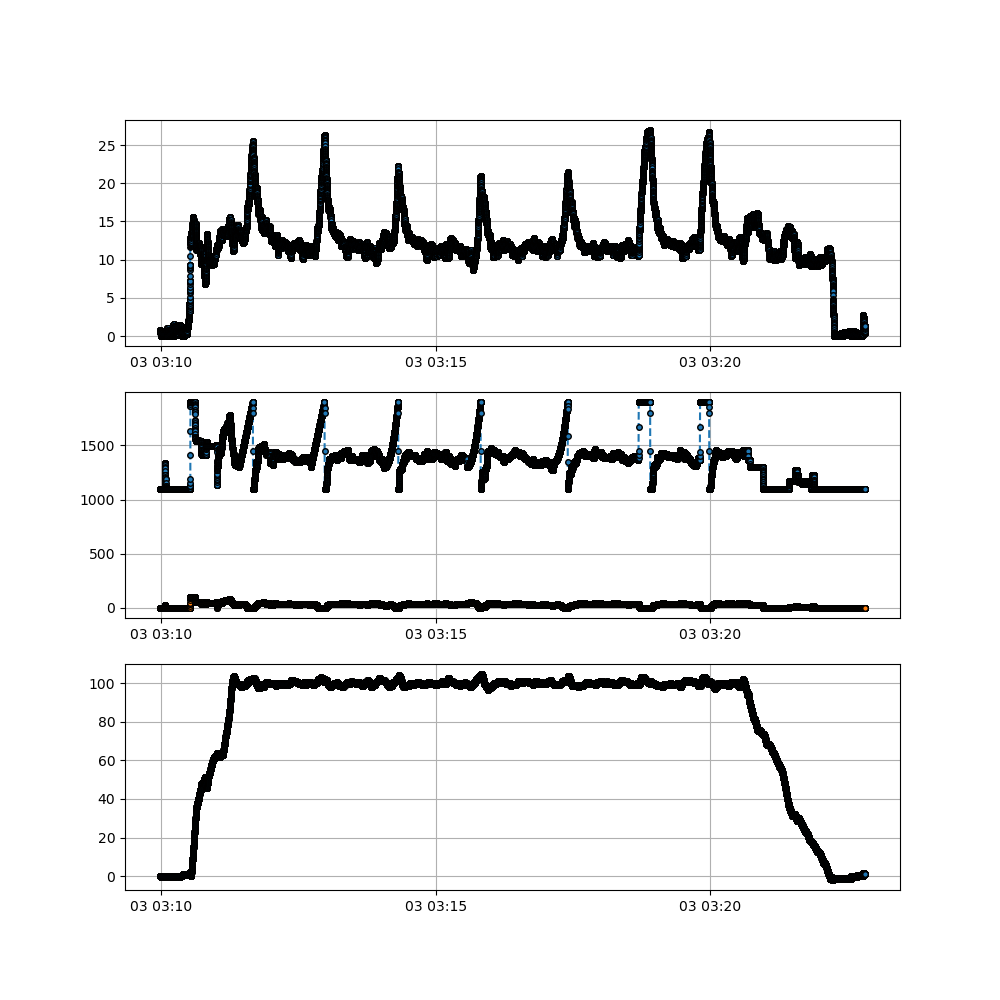

In [4]:
# Generating Plots
# bin_mask = (df['ThrottleOut'] == 1900) & (df['MainBatteryCurrent'] >= 5) & (df['Throttle'] != 100) & (df['Altitude_BARO_0'] > 50)
# jump = np.diff(np.int8(bin_mask))
# start_mask = jump > 0
# end_mask = jump < 0
# start_indices = np.where(start_mask)
# end_indices = np.where(end_mask)

# start_times = df.index[start_indices]
# end_times = df.index[end_indices]

# start_times = start_times + datetime.timedelta(milliseconds=500)
# end_times = end_times - datetime.timedelta(milliseconds=500)

# print(start_times)
# print(end_times)

plt.figure(figsize=(10,10))
ax0 = plt.subplot(3,1,1)
plt.grid("On")
plt.plot(df.index, df.Airspeed_Sensor0, linestyle='--', marker='o', markersize=4, markeredgecolor=[0,0,0])
ax1 = plt.subplot(3,1,2, sharex=ax0)
plt.grid("On")
plt.plot(df.index, df.ThrottleOut, linestyle='--', marker='o', markersize=4, markeredgecolor=[0,0,0])
plt.plot(df.index, df.Throttle, linestyle='--', marker='o', markersize=4, markeredgecolor=[0,0,0])
ax2 = plt.subplot(3,1,3, sharex=ax0)
plt.grid("On")
plt.plot(df.index, df.Altitude_BARO_0, linestyle='--', marker='o', markersize=4, markeredgecolor=[0,0,0])
plt.grid("On")
plt.show()

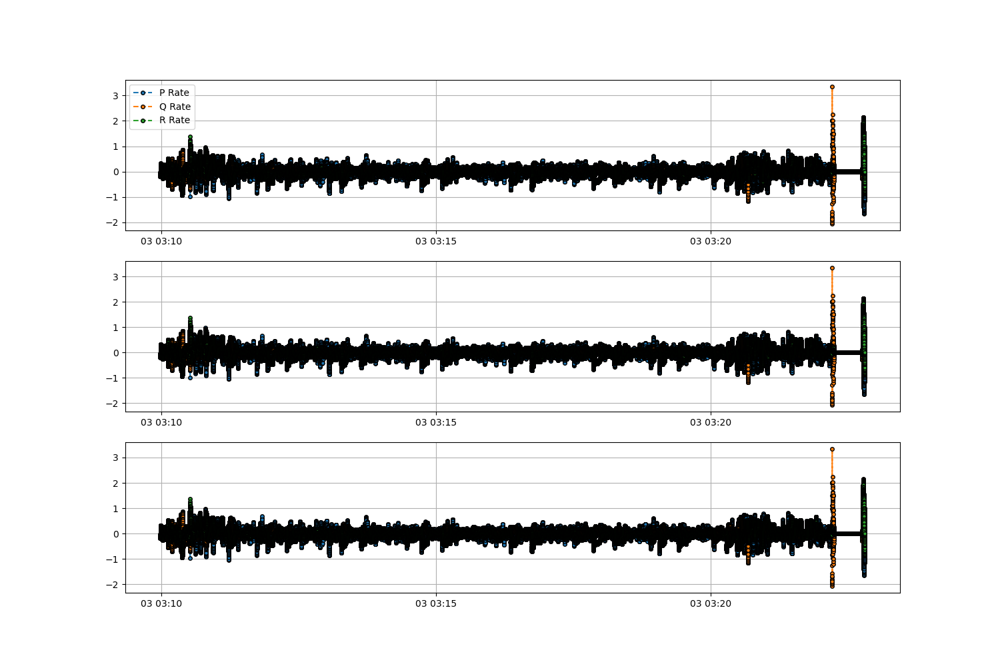

In [5]:
# Plotting the Rotational Rates
plt.figure(figsize=(15,10))
plt.tight_layout()

ax0 = plt.subplot(3,1,1)
plt.grid("On")
ax0.plot(df.index, df.GyroX_IMU0, linestyle='--', marker='o', markersize=4, markeredgecolor=[0,0,0], label="P Rate")
ax0.plot(df.index, df.GyroY_IMU0, linestyle='--', marker='o', markersize=4, markeredgecolor=[0,0,0], label="Q Rate")
ax0.plot(df.index, df.GyroZ_IMU0, linestyle='--', marker='o', markersize=4, markeredgecolor=[0,0,0], label="R Rate")
ax0.legend()

ax1 = plt.subplot(3,1,2, sharex=ax0)
plt.grid("On")
ax1.plot(df.index, df.GyroX_IMU0, linestyle='--', marker='o', markersize=4, markeredgecolor=[0,0,0])
ax1.plot(df.index, df.GyroY_IMU0, linestyle='--', marker='o', markersize=4, markeredgecolor=[0,0,0])
ax1.plot(df.index, df.GyroZ_IMU0, linestyle='--', marker='o', markersize=4, markeredgecolor=[0,0,0])

ax2 = plt.subplot(3,1,3, sharex=ax0)
ax2.plot(df.index, df.GyroX_IMU0, linestyle='--', marker='o', markersize=4, markeredgecolor=[0,0,0])
ax2.plot(df.index, df.GyroY_IMU0, linestyle='--', marker='o', markersize=4, markeredgecolor=[0,0,0])
ax2.plot(df.index, df.GyroZ_IMU0, linestyle='--', marker='o', markersize=4, markeredgecolor=[0,0,0])
plt.grid("On")
plt.show()

In [6]:
## Generating Map Plots Descending ## 
token = "pk.eyJ1Ijoid2tlbXA5NCIsImEiOiJjbGI0NHJuemkwMmF2M29zM24xcTlpNXVjIn0.qSiAc29MftNSOK2DOpRggw"
color_scale = [(0, 'orange'), (1,'red')]
df_example = df

fig = px.scatter_mapbox(df_example, 
                        lat="Latitude", 
                        lon="Longitude", 
                        hover_name=df_example.index, 
                        #hover_data=["Address", "Listed"],
                        color="Airspeed_Sensor0",
                        color_continuous_scale='jet',
                        #size="Listed",
                        zoom=15.5, 
                        height=600,
                        width=900,
                        labels={"Airspeed_Sensor0": 'Airspeed (m/s)'},
                        template='presentation')
fig.update_layout(mapbox_style="satellite", mapbox_accesstoken=token)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

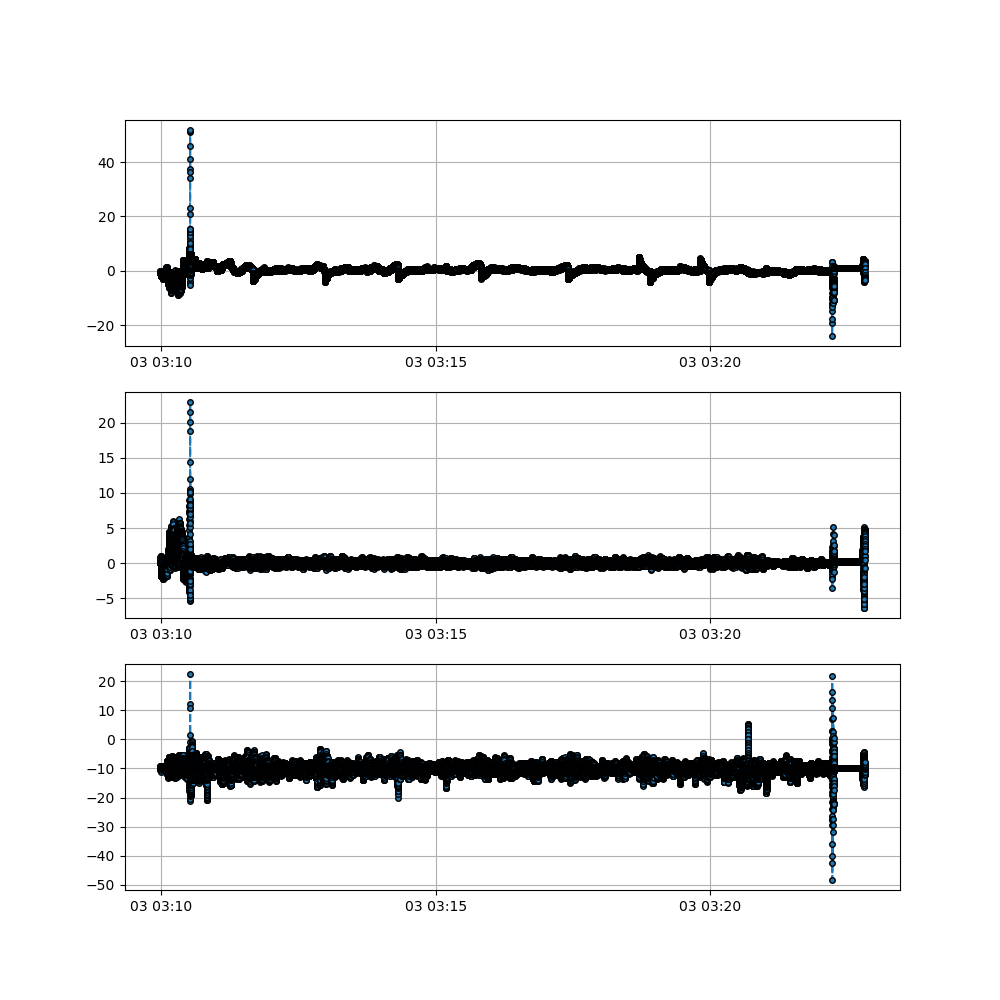

In [7]:
plt.figure(figsize=(10,10))
ax0 = plt.subplot(3,1,1)
plt.grid("On")
plt.plot(df.index, df.XAcc_IMU0, linestyle='--', marker='o', markersize=4, markeredgecolor=[0,0,0])
ax1 = plt.subplot(3,1,2, sharex=ax0)
plt.grid("On")
plt.plot(df.index, df.YAcc_IMU0, linestyle='--', marker='o', markersize=4, markeredgecolor=[0,0,0])
ax2 = plt.subplot(3,1,3, sharex=ax0)
plt.grid("On")
plt.plot(df.index, df.ZAcc_IMU0, linestyle='--', marker='o', markersize=4, markeredgecolor=[0,0,0])
plt.grid("On")
plt.show()

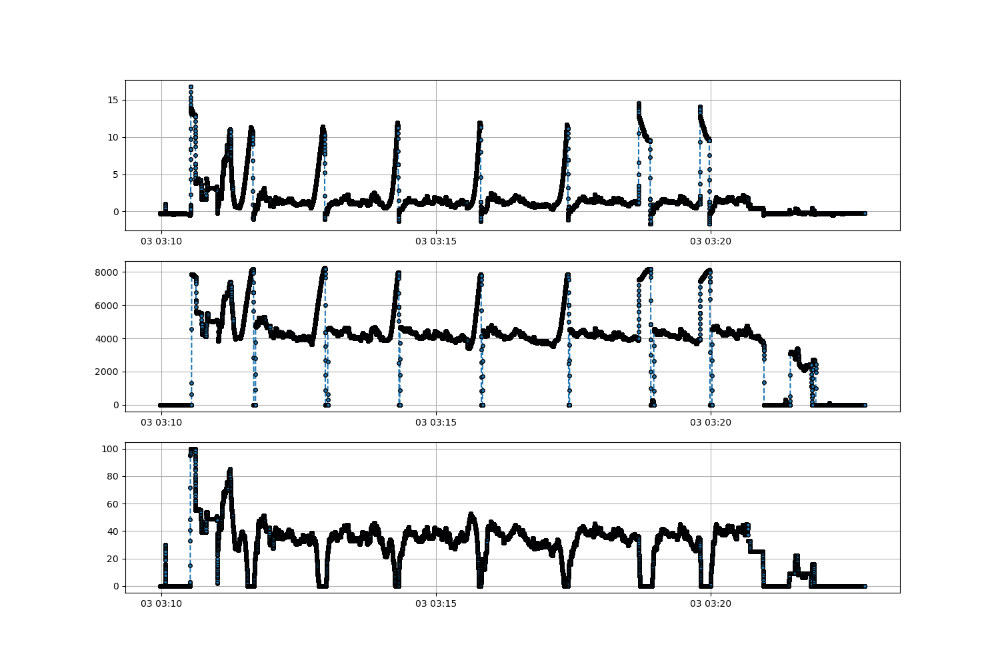

In [8]:
# Generating Plots

plt.figure(figsize=(15,10))
plt.tight_layout()

ax0 = plt.subplot(3,1,1)
plt.grid("On")
ax0.plot(df.index, df.MainBatteryCurrent, linestyle='--', marker='o', markersize=4, markeredgecolor=[0,0,0])

ax0 = plt.subplot(3,1,2, sharex=ax0)
plt.grid("On")
ax0.plot(df.index, df.MotorRPM, linestyle='--', marker='o', markersize=4, markeredgecolor=[0,0,0])

ax2 = plt.subplot(3,1,3, sharex=ax0)
ax2.plot(df.index, df.Throttle, linestyle='--', marker='o', markersize=4, markeredgecolor=[0,0,0])
plt.grid("On")
plt.show()

In [9]:
### Mask Initialization ###

# Generating Start/End Times for Segments #
# Producing masks for dataframe

def get_mask(df, start, end, year, month, day):
    # Getting boolean mask from start and end times
    start_time = get_datetime(start, year, month, day)
    end_time = get_datetime(end, year, month, day)
    mask = (df.index > start_time) & (df.index < end_time)
    return mask

def get_datetime(hour_string, year, month, day):
    # Results completed datetime from hour string, and date
    split_nums = hour_string.split(':')
    hours = int(split_nums[0])
    minutes = int(split_nums[1])
    seconds = int(split_nums[2])
    return pd.Timestamp(year=year, month=month, day=day, hour=hours, minute=minutes, second=seconds)

year = 2023
month = 6
day = 3

# Cruise Masking

seg_times = np.array([['03:11:25','03:11:40'],
                      ['03:12:44','03:12:58'],
                      ['03:14:03','03:14:18'],
                      ['03:15:34','03:15:48'],
                      ['03:17:09','03:17:24'],
                      ['03:18:42','03:18:54'],
                      ['03:19:49', '03:19:58']])
masks = []
for i in range(np.shape(seg_times)[0]):
    mask = get_mask(df, seg_times[i,0], seg_times[i,1], year, month, day)
    masks.append(mask)

In [10]:
############# Main Analysis ###############3

# Gravity
g = 9.807

# Attitude 
phi = np.deg2rad(df["RollAngle"].to_numpy())            # Bank angle in radians
theta = np.deg2rad(df["PitchAngle"].to_numpy())         # Pitch angle in radians

# Atmospheric adjustments:
rho = df["Pressure_BARO0"].to_numpy() * (287 * (df["Temperature_ARSP"].to_numpy()+273.15))**-1             # Density found from barometer pressure & airspeed sensor temperatures
v_eas = df["Airspeed_Sensor0"].to_numpy()                               # Equivalent SSL airspeed (m/s)
v_tas = v_eas * np.sqrt(1.225) * np.sqrt(rho)**-1   # the true airspeed
q = 0.5 * rho * v_tas**2                            # Dynamic pressure 

# For Descent method
h = df["Altitude_POS"].to_numpy()                   # Altitude
Vd_eas = df["DescentRate"].to_numpy()                  # Descent Rate from EKF (is it true or EAS at SSL?)
Vd_tas = Vd_eas * np.sqrt(1.225) * np.sqrt(rho)**-1   # the true airspeed

# Propulsion characterization
n = df["MotorRPM"].to_numpy() / 60                               # Revolutions per second
i_esc = df["MainBatteryCurrent"].to_numpy()                      # Really the ESC voltage and current here
v_esc = df["MainBatteryVoltage"].to_numpy()
J = v_tas / (n * prop.diameter)
eff = prop.efficiency(J) * motor.efficiency(n, i_esc)

# Inertial Measurement Unit
xp_acc = df["XAcc_IMU0"].to_numpy()                       # Acceleration in X direction of the IMU
zp_acc = df["ZAcc_IMU0"].to_numpy()                       # Acceleration in Z direction of the IMU

U_dot = xp_acc - 9.807 * np.sin(theta)
W_dot = zp_acc + 9.807 * np.cos(theta) * np.cos(phi)

# Beginning Power Required Calculation #

CT = prop.thrust_coeff(J)
T = CT * rho * n**2 * prop.diameter**4
P_req_t1 = (T * v_tas)
P_req_t2 = (mass * g * Vd_tas)
P_req_t3 = -(mass * U_dot * v_tas)
P_req = P_req_t1 + P_req_t2 + P_req_t3
D = P_req / v_tas

CD = D / (0.5 * rho * v_tas**2 * linus.area) # still need to estimate the wing area of linus
CL = cl_finders.cl_usbanked(linus, q, phi, W_dot)

/var/folders/x_/hvhbycx15x31bybxtb1h9ktc0000gn/T/ipykernel_64739/2376367759.py:11: RuntimeWarning:

invalid value encountered in reciprocal

/var/folders/x_/hvhbycx15x31bybxtb1h9ktc0000gn/T/ipykernel_64739/2376367759.py:13: RuntimeWarning:

invalid value encountered in reciprocal

/var/folders/x_/hvhbycx15x31bybxtb1h9ktc0000gn/T/ipykernel_64739/2376367759.py:19: RuntimeWarning:

invalid value encountered in reciprocal

/Users/williamkemp/Records/Repositories/CREATeV_AnalysisSuite/Investigations/../motors.py:53: RuntimeWarning:

invalid value encountered in reciprocal

/var/folders/x_/hvhbycx15x31bybxtb1h9ktc0000gn/T/ipykernel_64739/2376367759.py:43: RuntimeWarning:

divide by zero encountered in true_divide

/Users/williamkemp/Records/Repositories/CREATeV_AnalysisSuite/Investigations/../cl_finders.py:43: RuntimeWarning:

divide by zero encountered in reciprocal

/Users/williamkemp/Records/Repositories/CREATeV_AnalysisSuite/Investigations/../cl_finders.py:43: RuntimeWarning:

invalid va

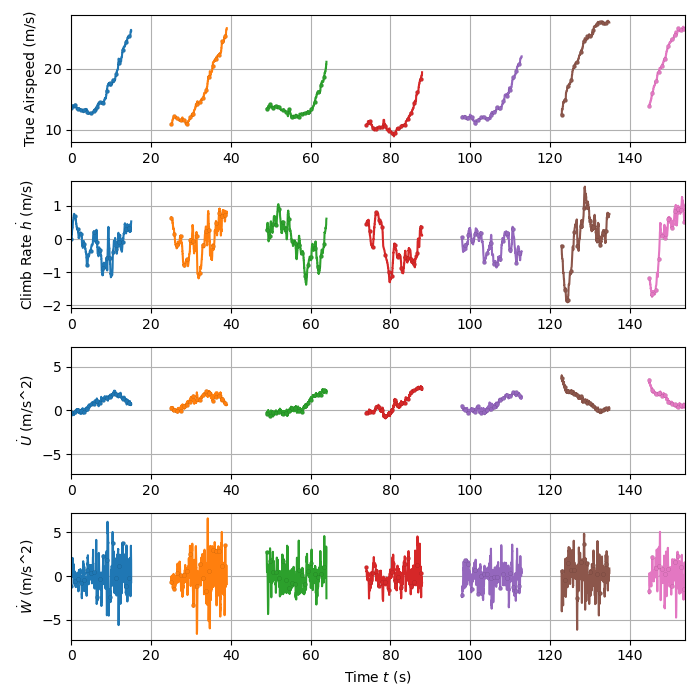

In [11]:
# Plotting Acceleration Runs
markerstyle = 'o'
markerevery = 80
markedgew = 0.05
plt.figure(figsize=(7,7))
ax1 = plt.subplot(4,1,1)
t_init = 0
for i in range(len(masks)):
    time_s = np.linspace(t_init, (len(v_tas[masks[i]])-1)/100 + t_init, len(v_tas[masks[i]]))
    ax1.plot(time_s, v_tas[masks[i]], marker=markerstyle, markeredgecolor=[0,0,0], markersize=3, markevery=markerevery, markeredgewidth=markedgew)
    t_init = time_s[-1]+10
ax1.set_ylabel("True Airspeed (m/s)")
ax1.grid(which='major', linestyle='-')
ax1.grid(which='minor', linestyle=':', color='grey')
ax1.autoscale(enable=True, axis='x', tight=True)

ax0 = plt.subplot(4,1,2, sharex=ax1)
t_init = 0
for i in range(len(masks)):
    time_s = np.linspace(t_init, (len(v_tas[masks[i]])-1)/100 + t_init, len(v_tas[masks[i]]))
    ax0.plot(time_s, Vd_tas[masks[i]], marker=markerstyle, markeredgecolor=[0,0,0], markersize=3, markevery=markerevery, markeredgewidth=markedgew)
    t_init = time_s[-1]+10
ax0.set_ylabel("Climb Rate $\dot{h}$ (m/s)")
ax0.grid(which='major', linestyle='-')
ax0.grid(which='minor', linestyle=':', color='grey')
ax0.autoscale(enable=True, axis='x', tight=True)

ax2 = plt.subplot(4,1,3, sharex=ax1)
t_init = 0
for i in range(len(masks)):
    time_s = np.linspace(t_init, (len(v_tas[masks[i]])-1)/100 + t_init, len(v_tas[masks[i]]))
    ax2.plot(time_s, U_dot[masks[i]], marker=markerstyle, markeredgecolor=[0,0,0], markersize=3, markevery=markerevery, markeredgewidth=markedgew)
    t_init = time_s[-1]+10
ax2.set_ylabel("$\dot{U}$ (m/s^2)")
ax2.grid(which='major', linestyle='-')
ax2.grid(which='minor', linestyle=':', color='grey')
ax2.autoscale(enable=True, axis='x', tight=True)

ax3 = plt.subplot(4,1,4, sharex=ax1, sharey=ax2)
t_init = 0
for i in range(len(masks)):
    time_s = np.linspace(t_init, (len(v_tas[masks[i]])-1)/100 + t_init, len(v_tas[masks[i]]))
    ax3.plot(time_s, W_dot[masks[i]], marker=markerstyle, markeredgecolor=[0,0,0], markersize=3, markevery=markerevery, markeredgewidth=markedgew)
    t_init = time_s[-1]+10
ax3.set_ylabel("$\dot{W}$ (m/s^2)")
ax3.set_xlabel("Time $t$ (s)")
ax3.grid(which='major', linestyle='-')
ax3.grid(which='minor', linestyle=':', color='grey')
ax3.autoscale(enable=True, axis='x', tight=True)

plt.tight_layout()
plt.show()

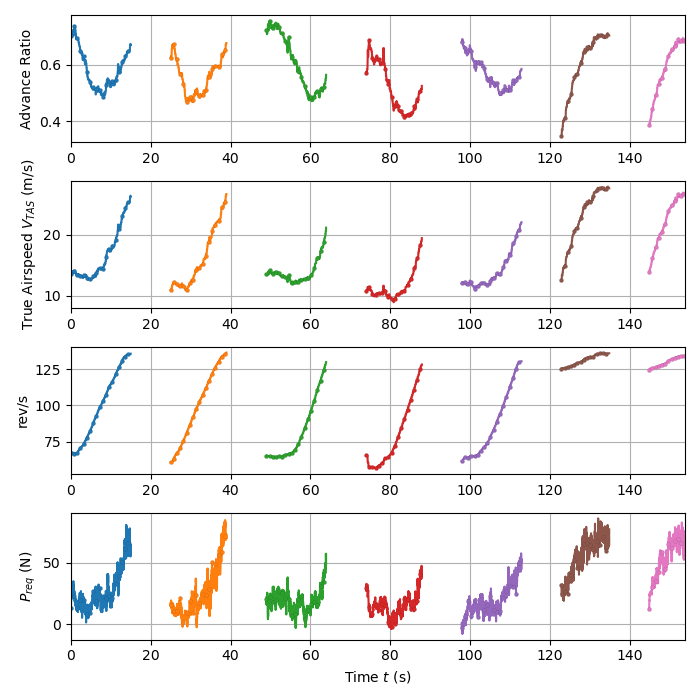

In [12]:
# Plotting Acceleration Runs
markerstyle = 'o'
markerevery = 80
markedgew = 0.05
plt.figure(figsize=(7,7))
ax1 = plt.subplot(4,1,1)
t_init = 0
for i in range(len(masks)):
    time_s = np.linspace(t_init, (len(v_tas[masks[i]])-1)/100 + t_init, len(v_tas[masks[i]]))
    ax1.plot(time_s, J[masks[i]], marker=markerstyle, markeredgecolor=[0,0,0], markersize=3, markevery=markerevery, markeredgewidth=markedgew)
    t_init = time_s[-1]+10
ax1.set_ylabel("Advance Ratio")
ax1.grid(which='major', linestyle='-')
ax1.grid(which='minor', linestyle=':', color='grey')
ax1.autoscale(enable=True, axis='x', tight=True)

ax0 = plt.subplot(4,1,2, sharex=ax1)
t_init = 0
for i in range(len(masks)):
    time_s = np.linspace(t_init, (len(v_tas[masks[i]])-1)/100 + t_init, len(v_tas[masks[i]]))
    ax0.plot(time_s, v_tas[masks[i]], marker=markerstyle, markeredgecolor=[0,0,0], markersize=3, markevery=markerevery, markeredgewidth=markedgew)
    t_init = time_s[-1]+10
ax0.set_ylabel("True Airspeed $V_{TAS}$ (m/s)")
ax0.grid(which='major', linestyle='-')
ax0.grid(which='minor', linestyle=':', color='grey')
ax0.autoscale(enable=True, axis='x', tight=True)

ax2 = plt.subplot(4,1,3, sharex=ax1)
t_init = 0
for i in range(len(masks)):
    time_s = np.linspace(t_init, (len(v_tas[masks[i]])-1)/100 + t_init, len(v_tas[masks[i]]))
    ax2.plot(time_s, n[masks[i]], marker=markerstyle, markeredgecolor=[0,0,0], markersize=3, markevery=markerevery, markeredgewidth=markedgew)
    t_init = time_s[-1]+10
ax2.set_ylabel("rev/s")
ax2.grid(which='major', linestyle='-')
ax2.grid(which='minor', linestyle=':', color='grey')
ax2.autoscale(enable=True, axis='x', tight=True)

ax3 = plt.subplot(4,1,4, sharex=ax1)
t_init = 0
for i in range(len(masks)):
    time_s = np.linspace(t_init, (len(v_tas[masks[i]])-1)/100 + t_init, len(v_tas[masks[i]]))
    ax3.plot(time_s, P_req[masks[i]], marker=markerstyle, markeredgecolor=[0,0,0], markersize=3, markevery=markerevery, markeredgewidth=markedgew)
    t_init = time_s[-1]+10
ax3.set_ylabel("$P_{req}$ (N)")
ax3.set_xlabel("Time $t$ (s)")
ax3.grid(which='major', linestyle='-')
ax3.grid(which='minor', linestyle=':', color='grey')
ax3.autoscale(enable=True, axis='x', tight=True)

plt.tight_layout()
plt.show()

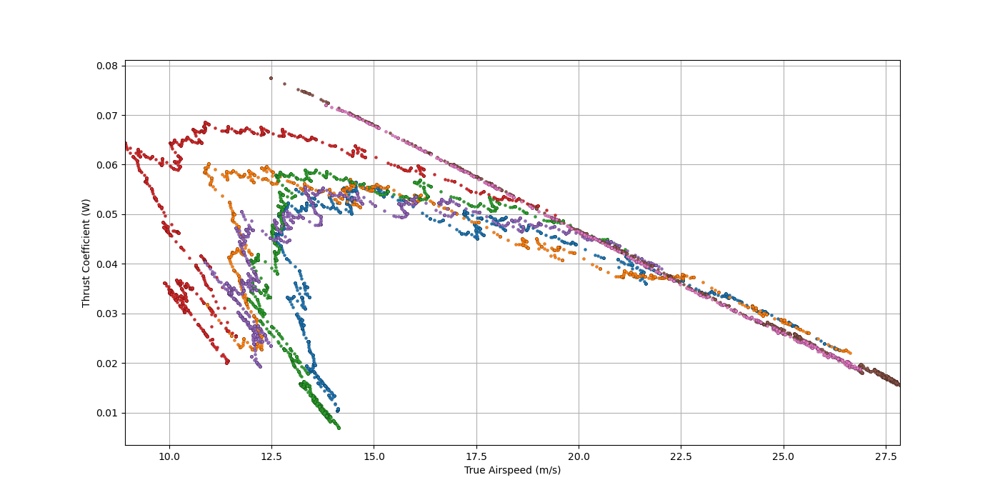

In [13]:
markerstyle = 'o'
markerevery = 1
markedgew = 0.1
plt.figure(figsize=(14,7))
ax1 = plt.subplot(1,1,1)
for i in range(len(masks)):
    ax1.plot(v_tas[masks[i]], CT[masks[i]], marker=markerstyle, markeredgecolor=[0,0,0], markersize=3, markevery=markerevery, markeredgewidth=markedgew, linestyle='')
ax1.set_ylabel("Thrust Coefficient (W)")
ax1.set_xlabel("True Airspeed (m/s)")
ax1.grid(which='major', linestyle='-')
ax1.grid(which='minor', linestyle=':', color='grey')
ax1.autoscale(enable=True, axis='x', tight=True)
plt.show()

In [14]:
# Importing XFLR5 Results

xlfr_results = pd.read_csv('../Results/XFLR5_Linus_PowervsTAS.csv', delimiter=',')
V_xflr = xlfr_results[xlfr_results.columns[0]]
P_xflr = xlfr_results[xlfr_results.columns[1]]

[0.013, 0.55]
[0.01805453 0.58529996]


/var/folders/x_/hvhbycx15x31bybxtb1h9ktc0000gn/T/ipykernel_64739/3004848205.py:23: RuntimeWarning:

Mean of empty slice.

/Users/williamkemp/opt/anaconda3/envs/superwake-records/lib/python3.10/site-packages/numpy/core/_methods.py:189: RuntimeWarning:

invalid value encountered in double_scalars

/var/folders/x_/hvhbycx15x31bybxtb1h9ktc0000gn/T/ipykernel_64739/3004848205.py:24: RuntimeWarning:

Mean of empty slice.



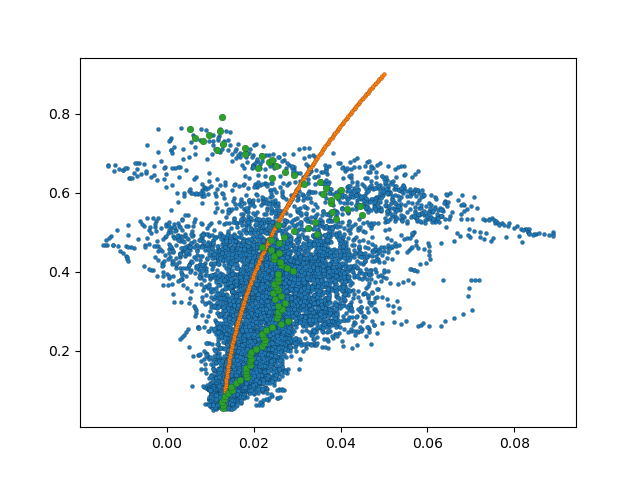

In [15]:
# Getting Drag and Lift Coefficients for the correct moments in the flight

cl_total = np.array([])
cd_total = np.array([])
for i in range(len(masks)):
    cl_total = np.append(cl_total, CL[masks[i]])
    cd_total = np.append(cd_total, CD[masks[i]])

savemat('../Results/cl_total.mat', {'cl_total': cl_total})
savemat('../Results/cd_total.mat', {'cd_total': cd_total})
polar_acceleration = cl_finders.cd2polar(linus, cd_total, cl_total, highorder=False)
polar_acceleration_lo = cl_finders.cd2polar(linus, cd_total, cl_total, highorder=False)
#polar_acceleration = [0.013, 0.55]

#polar_acceleration[1] = 0.9
print(polar_acceleration)
print(polar_acceleration_lo)

CL_fitted, CD_fitted = cl_finders.plotfittedpolar(linus, polar_acceleration, np.array([0.06, 0.9]))

bins = np.linspace(0.05, 0.830,100)
digitized = np.digitize(cl_total, bins)
cl_means = [cl_total[digitized == i].mean() for i in range(1, len(bins))]
cd_means = [cd_total[digitized == i].mean() for i in range(1, len(bins))]

plt.figure()
plt.plot(cd_total, cl_total, marker=markerstyle, markeredgecolor=[0,0,0], markersize=3, markevery=markerevery, markeredgewidth=markedgew, linestyle='')
plt.plot(CD_fitted, CL_fitted, marker=markerstyle, markeredgecolor=[0,0,0], markersize=3, markevery=markerevery, markeredgewidth=markedgew, linestyle='-')
plt.plot(cd_means, cl_means, marker=markerstyle, markeredgecolor=[0,0,0], markersize=5, markevery=markerevery, markeredgewidth=markedgew, linestyle='')
plt.show()
P_acc, EAS = cl_finders.polar2preqew(linus, polar_acceleration, (9,28), createvstandardweight=False)

In [16]:
def polarcurve_fit(CL_sq, cd0, k):
    # of the form CD = CD0 + kCL^2
    return cd0 + k * CL_sq

popt, pcov = optimize.curve_fit(polarcurve_fit, cl_total**2, cd_total, p0=[0, 0.1], maxfev=50000)
CD0 = popt[0]
K = popt[1]
e = (np.pi * linus.AR * K)**-1
print(popt)
print(e)

[0.01805453 0.0428221 ]
0.5852999604267788


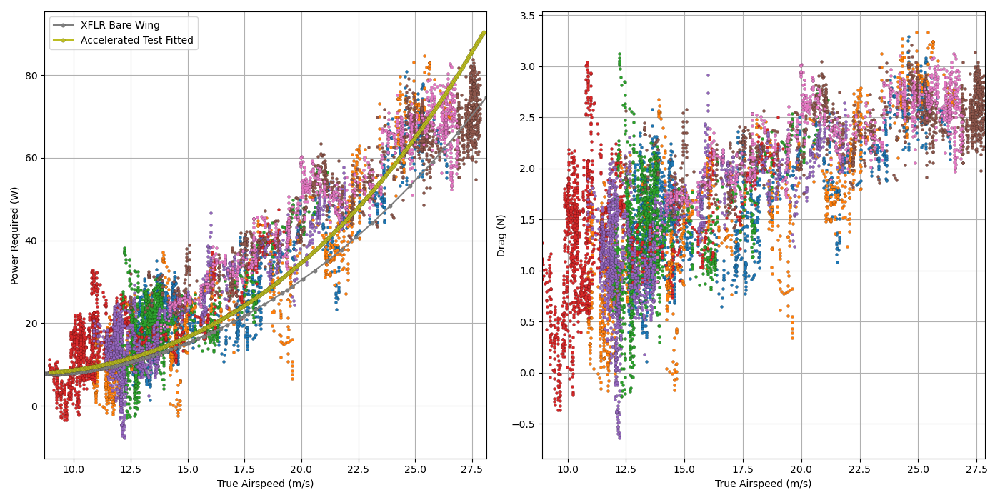

In [17]:
# Overplotting the results of the 6 Accelerations #

markerstyle = 'o'
markerevery = 1
markedgew = 0.1
plt.figure(figsize=(14,7))
ax1 = plt.subplot(1,2,1)
for i in range(len(masks)):
    ax1.plot(v_tas[masks[i]], P_req[masks[i]], marker=markerstyle, markeredgecolor=[0,0,0], markersize=3, markevery=markerevery, markeredgewidth=markedgew, linestyle='')
ax1.plot(V_xflr, P_xflr, marker=markerstyle, markeredgecolor=[0,0,0], markersize=4, markevery=markerevery, markeredgewidth=markedgew, linestyle='-', label='XFLR Bare Wing')
ax1.plot(EAS, P_acc, marker=markerstyle, markeredgecolor=[0,0,0], markersize=4, markevery=markerevery, markeredgewidth=markedgew, linestyle='-', label='Accelerated Test Fitted')
ax1.set_ylabel("Power Required (W)")
ax1.set_xlabel("True Airspeed (m/s)")
ax1.grid(which='major', linestyle='-')
ax1.grid(which='minor', linestyle=':', color='grey')
ax1.legend()
ax1.autoscale(enable=True, axis='x', tight=True)

ax2 = plt.subplot(1,2,2)
for i in range(len(masks)):
    ax2.plot(v_tas[masks[i]], D[masks[i]], marker=markerstyle, markeredgecolor=[0,0,0], markersize=3, markevery=markerevery, markeredgewidth=markedgew, linestyle='')
ax2.set_ylabel("Drag (N)")
ax2.set_xlabel("True Airspeed (m/s)")
ax2.grid(which='major', linestyle='-')
ax2.grid(which='minor', linestyle=':', color='grey')
ax2.autoscale(enable=True, axis='x', tight=True)
plt.tight_layout()
plt.show()

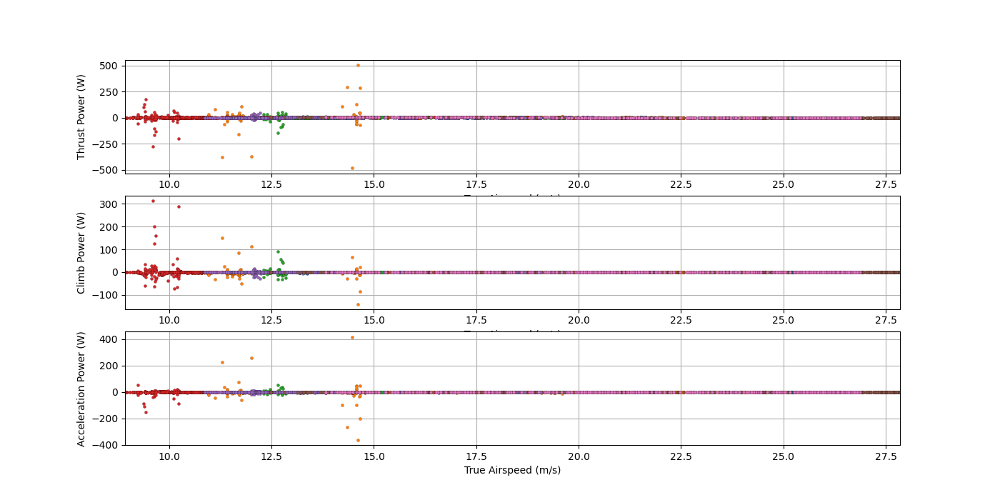

In [18]:
# Plotting all terms of power required to see significance

markerstyle = 'o'
markerevery = 1
markedgew = 0.1
plt.figure(figsize=(14,7))
ax1 = plt.subplot(3,1,1)
for i in range(len(masks)):
    ax1.plot(v_tas[masks[i]], P_req_t1[masks[i]]/P_req[masks[i]], marker=markerstyle, markeredgecolor=[0,0,0], markersize=3, markevery=markerevery, markeredgewidth=markedgew, linestyle='')
ax1.set_ylabel("Thrust Power (W)")
ax1.set_xlabel("True Airspeed (m/s)")
ax1.grid(which='major', linestyle='-')
ax1.grid(which='minor', linestyle=':', color='grey')
ax1.autoscale(enable=True, axis='x', tight=True)

ax2 = plt.subplot(3,1,2,sharex=ax1)
for i in range(len(masks)):
    ax2.plot(v_tas[masks[i]], P_req_t2[masks[i]]/P_req[masks[i]], marker=markerstyle, markeredgecolor=[0,0,0], markersize=3, markevery=markerevery, markeredgewidth=markedgew, linestyle='')
ax2.set_ylabel("Climb Power (W)")
ax2.set_xlabel("True Airspeed (m/s)")
ax2.grid(which='major', linestyle='-')
ax2.grid(which='minor', linestyle=':', color='grey')
ax2.autoscale(enable=True, axis='x', tight=True)

ax3 = plt.subplot(3,1,3, sharex=ax1)
for i in range(len(masks)):
    ax3.plot(v_tas[masks[i]], P_req_t3[masks[i]]/P_req[masks[i]], marker=markerstyle, markeredgecolor=[0,0,0], markersize=3, markevery=markerevery, markeredgewidth=markedgew, linestyle='')
ax3.set_ylabel("Acceleration Power (W)")
ax3.set_xlabel("True Airspeed (m/s)")
ax3.grid(which='major', linestyle='-')
ax3.grid(which='minor', linestyle=':', color='grey')
ax3.autoscale(enable=True, axis='x', tight=True)

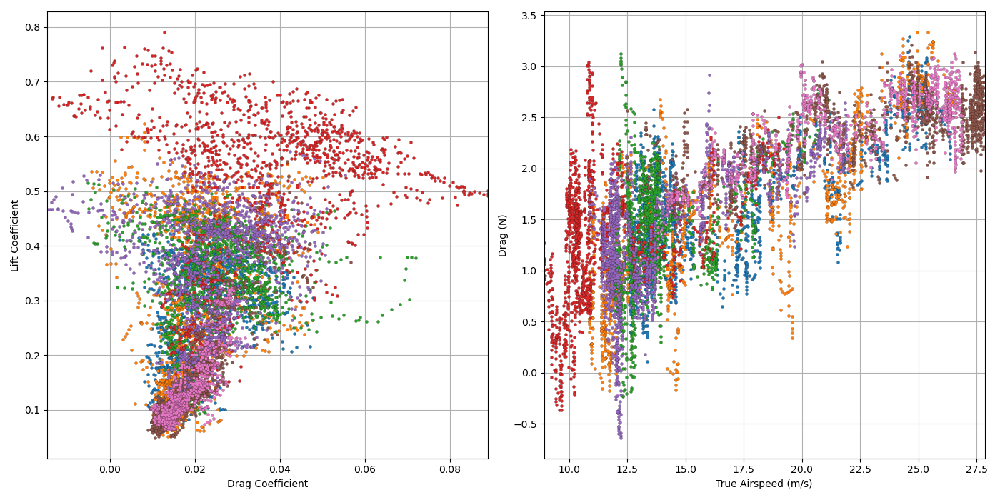

In [19]:
# Plotting the drag polar of the Vehicle

markerstyle = 'o'
markerevery = 1
markedgew = 0.1
plt.figure(figsize=(14,7))
ax1 = plt.subplot(1,2,1)
for i in range(len(masks)):
    ax1.plot(CD[masks[i]], CL[masks[i]], marker=markerstyle, markeredgecolor=[0,0,0], markersize=3, markevery=markerevery, markeredgewidth=markedgew, linestyle='')
ax1.set_ylabel("Lift Coefficient")
ax1.set_xlabel("Drag Coefficient")
ax1.grid(which='major', linestyle='-')
ax1.grid(which='minor', linestyle=':', color='grey')
ax1.autoscale(enable=True, axis='x', tight=True)

ax2 = plt.subplot(1,2,2)
for i in range(len(masks)):
    ax2.plot(v_tas[masks[i]], D[masks[i]], marker=markerstyle, markeredgecolor=[0,0,0], markersize=3, markevery=markerevery, markeredgewidth=markedgew, linestyle='')
ax2.set_ylabel("Drag (N)")
ax2.set_xlabel("True Airspeed (m/s)")
ax2.grid(which='major', linestyle='-')
ax2.grid(which='minor', linestyle=':', color='grey')
ax2.autoscale(enable=True, axis='x', tight=True)
plt.tight_layout()
plt.show()